# SoundCam Conference Room IRs - Exploratory Data Analysis

Exploring the impulse responses from the SoundCam dataset.

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import os

# Paths
base_dir = Path("..") / "data" / "SoundCam" / "ConferenceRoom_preprocessed"
npy_path = base_dir / "Empty" / "deconvolved.npy"

In [11]:
# Load the data
data = np.load(npy_path)

# Basic info
print("=" * 50)
print("BASIC INFO")
print("=" * 50)
print(f"Shape: {data.shape}")
print(f"Dtype: {data.dtype}")
print(f"Size: {data.nbytes / 1e6:.2f} MB")
print(f"\nMin value: {data.min():.6f}")
print(f"Max value: {data.max():.6f}")
print(f"Mean: {data.mean():.6f}")
print(f"Std: {data.std():.6f}")

BASIC INFO
Shape: (100, 10, 667200)
Dtype: float32
Size: 2668.80 MB

Min value: -0.188060
Max value: 0.178259
Mean: 0.000001
Std: 0.000606


In [12]:
# Interpret dimensions (likely: [positions, microphones, samples] or similar)
print("Dimension analysis:")
for i, dim in enumerate(data.shape):
    print(f"  Axis {i}: {dim} elements")

# Check for any NaN or Inf values
print(f"\nContains NaN: {np.isnan(data).any()}")
print(f"Contains Inf: {np.isinf(data).any()}")

Dimension analysis:
  Axis 0: 100 elements
  Axis 1: 10 elements
  Axis 2: 667200 elements

Contains NaN: False
Contains Inf: False


Total number of IRs: 1000
IR length: 667200 samples (13900.0 ms @ 48000 Hz)


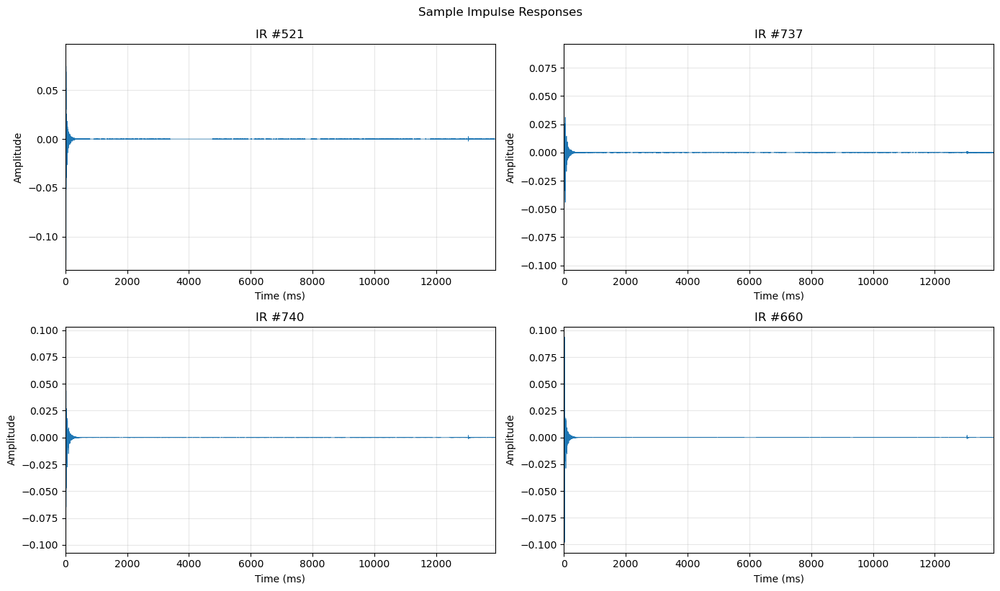

In [13]:
%matplotlib inline

# Plot a few example impulse responses
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

# Assuming last axis is samples (time axis)
num_samples = data.shape[-1]

# Sample rate assumption (common for room acoustics)
sr = 48000  # Hz - adjust if known differently
time_axis = np.arange(num_samples) / sr * 1000  # in ms

# Pick random IRs to display (flatten other dims)
data_2d = data.reshape(-1, num_samples)  # (num_IRs, samples)
num_irs = data_2d.shape[0]

print(f"Total number of IRs: {num_irs}")
print(f"IR length: {num_samples} samples ({num_samples/sr*1000:.1f} ms @ {sr} Hz)")

# Plot 4 random IRs
np.random.seed(42)
random_indices = np.random.choice(num_irs, size=4, replace=False)

for ax, idx in zip(axes, random_indices):
    ir = data_2d[idx]
    ax.plot(time_axis, ir, linewidth=0.5)
    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Amplitude")
    ax.set_title(f"IR #{idx}")
    ax.grid(True, alpha=0.3)
    ax.set_xlim([0, time_axis[-1]])

plt.tight_layout()
plt.suptitle("Sample Impulse Responses", y=1.02)
plt.show()

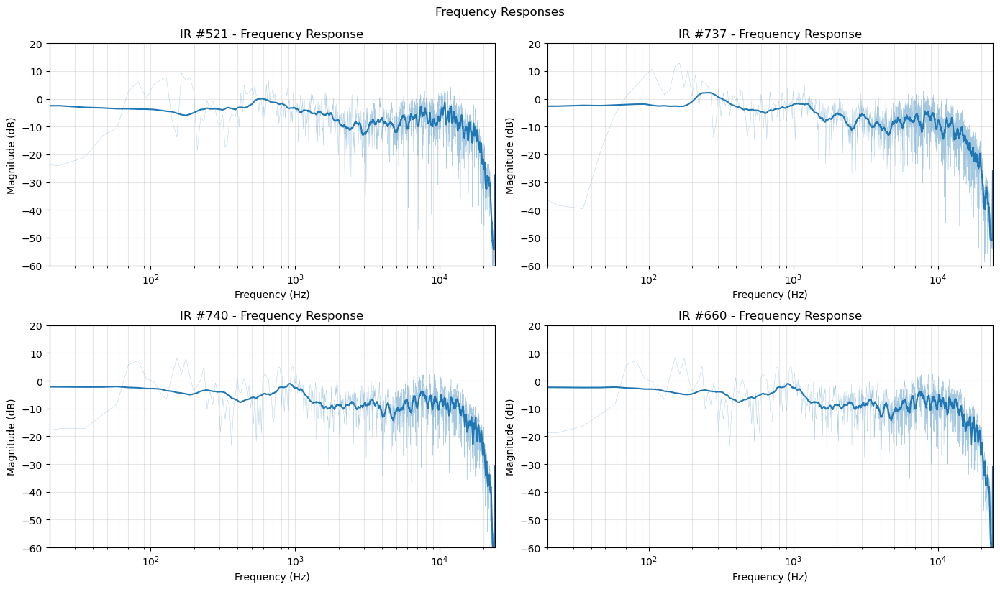

In [14]:
%matplotlib inline

# Plot frequency responses of the same IRs
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

nfft = 4096
freqs = np.fft.rfftfreq(nfft, d=1/sr)

for ax, idx in zip(axes, random_indices):
    ir = data_2d[idx]
    H = np.fft.rfft(ir, n=nfft)
    mag_db = 20 * np.log10(np.abs(H) + 1e-10)
    
    # Smooth with moving average
    window_size = 31
    mag_db_smooth = np.convolve(mag_db, np.ones(window_size)/window_size, mode='same')
    
    ax.semilogx(freqs, mag_db, linewidth=0.3, alpha=0.4, color='tab:blue')
    ax.semilogx(freqs, mag_db_smooth, linewidth=1.5, color='tab:blue')
    ax.set_xlabel("Frequency (Hz)")
    ax.set_ylabel("Magnitude (dB)")
    ax.set_title(f"IR #{idx} - Frequency Response")
    ax.grid(True, alpha=0.3, which='both')
    ax.set_xlim([20, sr/2])
    ax.set_ylim([-60, 20])

plt.tight_layout()
plt.suptitle("Frequency Responses", y=1.02)
plt.show()

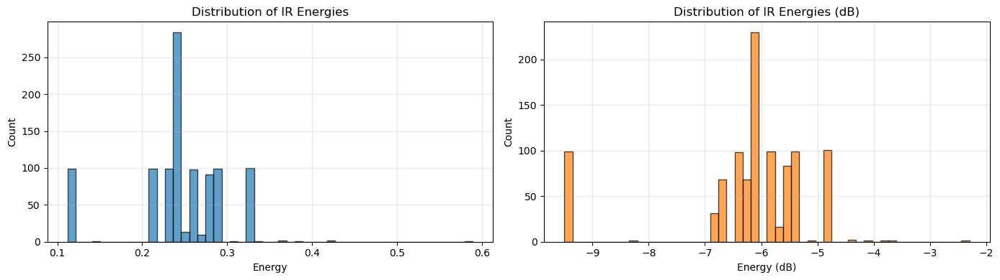

Energy range: 0.112208 to 0.589352
Energy range (dB): -9.5 dB to -2.3 dB


In [15]:
%matplotlib inline

# Energy distribution across all IRs
energies = np.sum(data_2d ** 2, axis=1)

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

# Histogram of energies
axes[0].hist(energies, bins=50, edgecolor='black', alpha=0.7)
axes[0].set_xlabel("Energy")
axes[0].set_ylabel("Count")
axes[0].set_title("Distribution of IR Energies")
axes[0].grid(True, alpha=0.3)

# Energy in dB
energies_db = 10 * np.log10(energies + 1e-10)
axes[1].hist(energies_db, bins=50, edgecolor='black', alpha=0.7, color='tab:orange')
axes[1].set_xlabel("Energy (dB)")
axes[1].set_ylabel("Count")
axes[1].set_title("Distribution of IR Energies (dB)")
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Energy range: {energies.min():.6f} to {energies.max():.6f}")
print(f"Energy range (dB): {energies_db.min():.1f} dB to {energies_db.max():.1f} dB")

In [ ]:
%matplotlib inline

# Plot all IRs overlaid to see variation
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Subsample if too many IRs
max_plot = min(100, num_irs)
subsample_idx = np.linspace(0, num_irs-1, max_plot, dtype=int)

# Time domain overlay
for idx in subsample_idx:
    axes[0].plot(time_axis, data_2d[idx], linewidth=0.2, alpha=0.3, color='tab:blue')
axes[0].plot(time_axis, data_2d.mean(axis=0), linewidth=1.5, color='red', label='Mean')
axes[0].set_xlabel("Time (ms)")
axes[0].set_ylabel("Amplitude")
axes[0].set_title(f"Overlay of {max_plot} IRs (Time Domain)")
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim([0, time_axis[-1]])

# Frequency domain overlay
for idx in subsample_idx:
    ir = data_2d[idx]
    H = np.fft.rfft(ir, n=nfft)
    mag_db = 20 * np.log10(np.abs(H) + 1e-10)
    axes[1].semilogx(freqs, mag_db, linewidth=0.2, alpha=0.3, color='tab:blue')

# Mean
H_mean = np.fft.rfft(data_2d.mean(axis=0), n=nfft)
mag_db_mean = 20 * np.log10(np.abs(H_mean) + 1e-10)
axes[1].semilogx(freqs, mag_db_mean, linewidth=1.5, color='red', label='Mean')
axes[1].set_xlabel("Frequency (Hz)")
axes[1].set_ylabel("Magnitude (dB)")
axes[1].set_title(f"Overlay of {max_plot} IRs (Frequency Domain)")
axes[1].legend()
axes[1].grid(True, alpha=0.3, which='both')
axes[1].set_xlim([20, sr/2])

plt.tight_layout()
plt.show()

C:\Users\ferma\AppData\Local\Temp\ipykernel_8424\4072848088.py:39: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


Exploring data structure:
Original shape: (100, 10, 667200)

3D data: 100 x 10 measurement points, 667200 samples per IR


c:\Users\ferma\.conda\envs\DAFx26\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


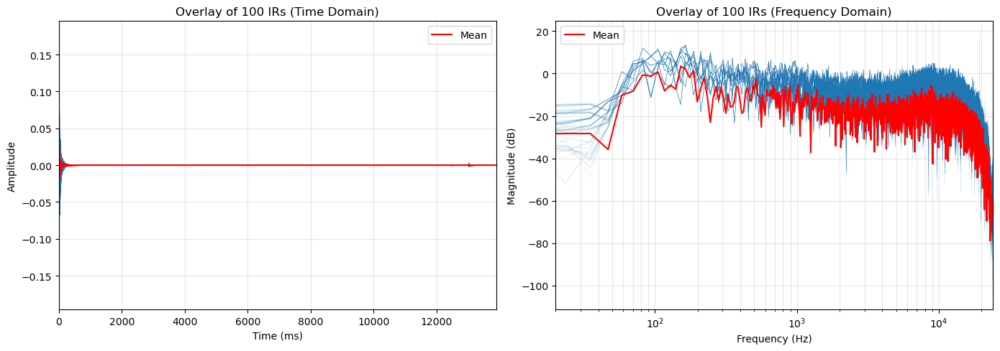

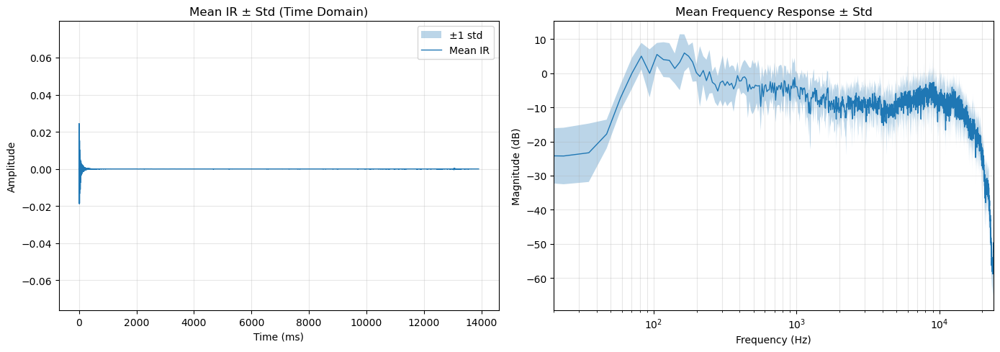

In [17]:
%matplotlib inline

# Explore spatial structure if data is multidimensional
print("Exploring data structure:")
print(f"Original shape: {data.shape}")

if len(data.shape) == 3:
    print(f"\n3D data: {data.shape[0]} x {data.shape[1]} measurement points, {data.shape[2]} samples per IR")
    
    # Compute mean ± std across all IRs
    mean_ir = data_2d.mean(axis=0)
    std_ir = data_2d.std(axis=0)
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Time domain
    axes[0].fill_between(time_axis, mean_ir - std_ir, mean_ir + std_ir, alpha=0.3, label='±1 std')
    axes[0].plot(time_axis, mean_ir, linewidth=1, label='Mean IR')
    axes[0].set_xlabel("Time (ms)")
    axes[0].set_ylabel("Amplitude")
    axes[0].set_title("Mean IR ± Std (Time Domain)")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # Frequency domain - mean ± std
    all_mags_db = 20 * np.log10(np.abs(np.fft.rfft(data_2d, n=nfft, axis=1)) + 1e-10)
    mag_db_mean_all = all_mags_db.mean(axis=0)
    mag_db_std_all = all_mags_db.std(axis=0)
    
    axes[1].fill_between(freqs, mag_db_mean_all - mag_db_std_all, mag_db_mean_all + mag_db_std_all, alpha=0.3)
    axes[1].semilogx(freqs, mag_db_mean_all, linewidth=1)
    axes[1].set_xlabel("Frequency (Hz)")
    axes[1].set_ylabel("Magnitude (dB)")
    axes[1].set_title("Mean Frequency Response ± Std")
    axes[1].grid(True, alpha=0.3, which='both')
    axes[1].set_xlim([20, sr/2])
    
    plt.tight_layout()
    plt.show()

elif len(data.shape) == 4:
    print(f"\n4D data: likely [x_pos, y_pos, channels, samples] or similar")
    print(f"  Could represent a 2D grid of {data.shape[0]}x{data.shape[1]} positions")
elif len(data.shape) == 2:
    print(f"\n2D data: {data.shape[0]} IRs, {data.shape[1]} samples each")

Let us now see whether there is much difference between the measured responses in the different datapoints (measurements):

In [38]:
from IPython.display import HTML
import matplotlib.animation as animation

# Animation across datapoints for a fixed microphone position (no interpolation)

mic_idx = 0  # Fixed microphone index
num_datapoints = min(20, data.shape[0])  # Limit number of datapoints to animate

irs = data[:num_datapoints, mic_idx, :]  # (num_datapoints, num_samples)
H = np.fft.rfft(irs, n=nfft, axis=1)
mag_db_all = 20 * np.log10(np.abs(H) + 1e-10)

# Precompute smoothed magnitudes using log-freq smoothing
mag_db_smooth_all = np.array([
    smooth_on_log_freq(mag_db, freqs, freqs_log, smooth_window)
    for mag_db in mag_db_all
])

time_ylim = np.max(np.abs(irs)) * 1.1
freq_ylim = (mag_db_all.min() - 5, mag_db_all.max() + 5)

fig, (ax_time, ax_freq) = plt.subplots(1, 2, figsize=(14, 5))

line_time, = ax_time.plot([], [], lw=0.8, color="tab:blue")
ax_time.set_xlabel("Time (ms)")
ax_time.set_ylabel("Amplitude")
ax_time.set_xlim(time_axis[0], 16384/sr*1000)
ax_time.set_ylim(-time_ylim, time_ylim)
ax_time.grid(True, alpha=0.3)

line_freq, = ax_freq.semilogx([], [], lw=0.3, alpha=0.4, color="tab:orange")
line_freq_smooth, = ax_freq.semilogx([], [], lw=1.5, color="tab:orange", label="Log-smoothed")
ax_freq.set_xlabel("Frequency (Hz)")
ax_freq.set_ylabel("Magnitude (dB)")
ax_freq.set_xlim(20, sr / 2)
ax_freq.set_ylim(*freq_ylim)
ax_freq.grid(True, alpha=0.3, which="both")
ax_freq.legend(loc="upper right")

title = fig.suptitle("")

def init():
    line_time.set_data([], [])
    line_freq.set_data([], [])
    line_freq_smooth.set_data([], [])
    title.set_text("")
    return line_time, line_freq, line_freq_smooth, title

def update(frame):
    ir = irs[frame]
    mag_db = mag_db_all[frame]
    mag_db_smooth = mag_db_smooth_all[frame]
    line_time.set_data(time_axis, ir)
    line_freq.set_data(freqs, mag_db)
    line_freq_smooth.set_data(freqs, mag_db_smooth)
    title.set_text(f"Responses across datapoints (Mic {mic_idx}, no interpolation) — Datapoint {frame}")
    return line_time, line_freq, line_freq_smooth, title

anim = animation.FuncAnimation(
    fig, update, frames=num_datapoints, init_func=init, blit=False, interval=400
)

plt.close(fig)
HTML(anim.to_jshtml())

There seems to be almost no difference between different datapoints, so wqe may stick to the fist one, for example. The changes are noticeable between microphone positions: see below. 

In [39]:
from IPython.display import HTML

# Animation of IRs and frequency responses across microphones for one datapoint
import matplotlib.animation as animation

datapoint_idx = 50
num_mics = min(10, data.shape[1])

irs = data[datapoint_idx, :num_mics, :]  # (num_mics, num_samples)
H = np.fft.rfft(irs, n=nfft, axis=1)
mag_db_all = 20 * np.log10(np.abs(H) + 1e-10)

# Log-frequency smoothing parameters
n_log_points = 256
smooth_window = 15
f_min, f_max = 20.0, sr / 2

# Create log-spaced frequency axis
freqs_log = np.logspace(np.log10(f_min), np.log10(f_max), n_log_points)

def smooth_on_log_freq(mag_db_lin, freqs_lin, freqs_log, smooth_win):
    """Interpolate to log-freq, smooth, interpolate back to linear."""
    # Interpolate to log-spaced frequencies
    mag_db_log = np.interp(freqs_log, freqs_lin, mag_db_lin)
    # Smooth on log-freq axis
    kernel = np.ones(smooth_win) / smooth_win
    mag_db_log_smooth = np.convolve(mag_db_log, kernel, mode='same')
    # Interpolate back to linear frequencies for plotting
    mag_db_smooth = np.interp(freqs_lin, freqs_log, mag_db_log_smooth)
    return mag_db_smooth

# Precompute smoothed magnitudes using log-freq smoothing
mag_db_smooth_all = np.array([
    smooth_on_log_freq(mag_db, freqs, freqs_log, smooth_window)
    for mag_db in mag_db_all
])

time_ylim = np.max(np.abs(irs)) * 1.1
freq_ylim = (mag_db_all.min() - 5, mag_db_all.max() + 5)

fig, (ax_time, ax_freq) = plt.subplots(1, 2, figsize=(14, 5))

line_time, = ax_time.plot([], [], lw=0.8, color="tab:blue")
ax_time.set_xlabel("Time (ms)")
ax_time.set_ylabel("Amplitude")
ax_time.set_xlim(time_axis[0], 16384/sr*1000)
ax_time.set_ylim(-time_ylim, time_ylim)
ax_time.grid(True, alpha=0.3)

line_freq, = ax_freq.semilogx([], [], lw=0.3, alpha=0.4, color="tab:orange")
line_freq_smooth, = ax_freq.semilogx([], [], lw=1.5, color="tab:orange", label="Log-smoothed")
ax_freq.set_xlabel("Frequency (Hz)")
ax_freq.set_ylabel("Magnitude (dB)")
ax_freq.set_xlim(20, sr / 2)
ax_freq.set_ylim(*freq_ylim)
ax_freq.grid(True, alpha=0.3, which="both")
ax_freq.legend(loc="upper right")

title = fig.suptitle("")

def init():
    line_time.set_data([], [])
    line_freq.set_data([], [])
    line_freq_smooth.set_data([], [])
    title.set_text("")
    return line_time, line_freq, line_freq_smooth, title

def update(frame):
    ir = irs[frame]
    mag_db = mag_db_all[frame]
    mag_db_smooth = mag_db_smooth_all[frame]
    line_time.set_data(time_axis, ir)
    line_freq.set_data(freqs, mag_db)
    line_freq_smooth.set_data(freqs, mag_db_smooth)
    title.set_text(f"Responses from 10 mics (no interpolation) — Datapoint {datapoint_idx}, Microphone {frame}")
    return line_time, line_freq, line_freq_smooth, title

anim = animation.FuncAnimation(
    fig, update, frames=num_mics, init_func=init, blit=False, interval=800
)

plt.close(fig)
HTML(anim.to_jshtml())

If we interpolate (magnitude and unwrapped phase) the responses at the different microphone positions, we get a picture of the smooth variation of the response with respect to position

In [34]:
from IPython.display import HTML
import matplotlib.animation as animation

# Animation with interpolated magnitude responses between microphones
# Similar to interpolate_IRs in experiment_03.py: interpolate mag (dB) and unwrapped phase

datapoint_idx = 0
num_mics = min(10, data.shape[1])
interp_steps = 10  # Number of interpolation steps between each pair of mics

irs = data[datapoint_idx, :num_mics, :]  # (num_mics, num_samples)
H_all = np.fft.rfft(irs, n=nfft, axis=1)  # Complex spectra
mag_db_all = 20 * np.log10(np.abs(H_all) + 1e-10)
phase_all = np.angle(H_all)

# Unwrap phase along frequency axis for each mic
phase_unwrapped_all = np.unwrap(phase_all, axis=1)

# Consistent IR length for all frames
ir_len = min(nfft, num_samples)

def interpolate_response(alpha, idx1, idx2):
    """Interpolate magnitude (dB) and unwrapped phase between two mic responses."""
    mag_db_interp = (1 - alpha) * mag_db_all[idx1] + alpha * mag_db_all[idx2]
    phase_interp = (1 - alpha) * phase_unwrapped_all[idx1] + alpha * phase_unwrapped_all[idx2]
    
    # Reconstruct complex spectrum
    mag_lin = 10 ** (mag_db_interp / 20)
    H_interp = mag_lin * np.exp(1j * phase_interp)
    
    # IFFT back to time domain
    ir_interp = np.fft.irfft(H_interp, n=nfft)[:ir_len]
    
    return ir_interp, mag_db_interp

# Precompute all interpolated frames
total_frames = (num_mics - 1) * interp_steps + 1
interp_irs = np.zeros((total_frames, ir_len))
interp_mag_dbs = np.zeros((total_frames, mag_db_all.shape[1]))
frame_labels = []

frame_idx = 0
for i in range(num_mics - 1):
    for step in range(interp_steps):
        alpha = step / interp_steps
        ir_interp, mag_db_interp = interpolate_response(alpha, i, i + 1)
        interp_irs[frame_idx] = ir_interp
        interp_mag_dbs[frame_idx] = mag_db_interp
        frame_labels.append(f"Mic {i} → {i+1} (α={alpha:.2f})")
        frame_idx += 1

# Add the last mic (use IFFT to match length)
last_ir = np.fft.irfft(H_all[-1], n=nfft)[:ir_len]
interp_irs[frame_idx] = last_ir
interp_mag_dbs[frame_idx] = mag_db_all[-1]
frame_labels.append(f"Mic {num_mics - 1}")

# Precompute smoothed magnitudes
interp_mag_dbs_smooth = np.array([
    smooth_on_log_freq(mag_db, freqs, freqs_log, smooth_window)
    for mag_db in interp_mag_dbs
])

# Use consistent time axis for plotting
time_axis_interp = np.arange(ir_len) / sr * 1000

time_ylim = np.max(np.abs(interp_irs)) * 1.1
freq_ylim = (interp_mag_dbs.min() - 5, interp_mag_dbs.max() + 5)

fig, (ax_time, ax_freq) = plt.subplots(1, 2, figsize=(14, 5))

line_time, = ax_time.plot([], [], lw=0.8, color="tab:blue")
ax_time.set_xlabel("Time (ms)")
ax_time.set_ylabel("Amplitude")
ax_time.set_xlim(time_axis_interp[0], time_axis_interp[-1])
ax_time.set_ylim(-time_ylim, time_ylim)
ax_time.grid(True, alpha=0.3)

line_freq, = ax_freq.semilogx([], [], lw=0.3, alpha=0.4, color="tab:orange")
line_freq_smooth, = ax_freq.semilogx([], [], lw=1.5, color="tab:orange", label="Log-smoothed")
ax_freq.set_xlabel("Frequency (Hz)")
ax_freq.set_ylabel("Magnitude (dB)")
ax_freq.set_xlim(20, sr / 2)
ax_freq.set_ylim(*freq_ylim)
ax_freq.grid(True, alpha=0.3, which="both")
ax_freq.legend(loc="upper right")

title = fig.suptitle("")

def init():
    line_time.set_data([], [])
    line_freq.set_data([], [])
    line_freq_smooth.set_data([], [])
    title.set_text("")
    return line_time, line_freq, line_freq_smooth, title

def update(frame):
    ir = interp_irs[frame]
    mag_db = interp_mag_dbs[frame]
    mag_db_smooth = interp_mag_dbs_smooth[frame]
    line_time.set_data(time_axis_interp, ir)
    line_freq.set_data(freqs, mag_db)
    line_freq_smooth.set_data(freqs, mag_db_smooth)
    title.set_text(f"Responses from 10 mics (with interpolation) — {frame_labels[frame]}")
    return line_time, line_freq, line_freq_smooth, title

anim = animation.FuncAnimation(
    fig, update, frames=total_frames, init_func=init, blit=False, interval=100
)

plt.close(fig)
HTML(anim.to_jshtml())